# Bulk RNA-Seq GTEX code

Basic imports

In [1]:
import polars as pl
from pathlib import Path
from pycomfort.files import *
from pycomfort import files
import pyarrow
import pandas as pd
from functional import seq

Setup output configs for pandas and polars

In [2]:
pd.set_option("max_colwidth", None)
pd.set_option("max_seq_items", None)
pl.Config.set_tbl_width_chars(10000)
pl.Config.set_fmt_str_lengths(1000)

polars.cfg.Config

setting up paths

In [3]:
base = Path("..").absolute().resolve()
data = base / "data"
input = data / "input"
gtex = input / "gtex"
gtex.mkdir(parents=True, exist_ok=True)
tprint(gtex)

gtex
	GTEx_8_tissues_snRNAseq_atlas_071421.public_obs.h5ad
	GTEx_Analysis_v8_Annotations_SubjectPhenotypesDS.txt
	GTEx_Analysis_2017-06-05_v8_RNASeQCv1.1.9_gene_tpm_stable_expressions.tsv
	GTEx_Analysis_2017-06-05_v8_RNASeQCv1.1.9_gene_tpm.gct.gz
	GTEx_Analysis_v8_Annotations_SampleAttributesDS.txt
	GTEx_8_tissues_snRNAseq_immune_atlas_071421.public_obs.h5ad
	samples_with_subjects.parquet
	GTEx_Analysis_2017-06-05_v8_RNASeQCv1.1.9_gene_tpm_stable.gct


## Bulk RNA-Seq

In [4]:
gct = files.with_ext(gtex, ".gct")[0]
gct

PosixPath('/home/antonkulaga/rna-clock/data/input/gtex/GTEx_Analysis_2017-06-05_v8_RNASeQCv1.1.9_gene_tpm_stable.gct')

In [5]:
exp_path = gtex / "GTEx_Analysis_2017-06-05_v8_RNASeQCv1.1.9_gene_tpm_stable_expressions.tsv"

In [6]:
expressions = pl.read_csv(str(exp_path), comment_char="#", sep="\t")
expressions.head()

shape: (0, 9618)
┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┬─────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┬─────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┬────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────

In [7]:
sample_file = gtex / "GTEx_Analysis_v8_Annotations_SampleAttributesDS.txt"
phenotypes_file = gtex / "GTEx_Analysis_v8_Annotations_SubjectPhenotypesDS.txt"

In [8]:
samples = pl.read_csv(sample_file,comment_char="#", sep="\t", ignore_errors=True)
samples.head(10)

SAMPID,SMATSSCR,SMCENTER,SMPTHNTS,SMRIN,SMTS,SMTSD,SMUBRID,SMTSISCH,SMTSPAX,SMNABTCH,SMNABTCHT,SMNABTCHD,SMGEBTCH,SMGEBTCHD,SMGEBTCHT,SMAFRZE,SMGTC,SME2MPRT,SMCHMPRS,SMNTRART,SMNUMGPS,SMMAPRT,SMEXNCRT,SM550NRM,SMGNSDTC,SMUNMPRT,SM350NRM,SMRDLGTH,SMMNCPB,SME1MMRT,SMSFLGTH,SMESTLBS,SMMPPD,SMNTERRT,SMRRNANM,SMRDTTL,SMVQCFL,SMMNCV,SMTRSCPT,SMMPPDPR,SMCGLGTH,SMGAPPCT,SMUNPDRD,SMNTRNRT,SMMPUNRT,SMEXPEFF,SMMPPDUN,SME2MMRT,SME2ANTI,SMALTALG,SME2SNSE,SMMFLGTH,SME1ANTI,SMSPLTRD,SMBSMMRT,SME1SNSE,SME1PCTS,SMRRNART,SME1MPRT,SMNUM5CD,SMDPMPRT,SME2PCTS
str,i64,str,str,f64,str,str,str,i64,i64,str,str,str,str,str,str,str,str,f64,i64,f64,str,f64,f64,str,i64,i64,str,i64,str,f64,i64,i64,f64,f64,f64,f64,f64,str,i64,f64,str,str,i64,f64,f64,f64,f64,f64,f64,f64,f64,i64,f64,f64,f64,f64,f64,f64,f64,str,i64,f64
"""GTEX-1117F-0003-SM-58Q7G""",null,"""B1""",null,null,"""Blood""","""Whole Blood""","""0013756""",1188,null,"""BP-38516""","""DNA isolation_Whole Blood_QIAGEN Puregene (Manual)""","""05/02/2013""","""LCSET-4574""","""01/15/2014""","""Standard Exome Sequencing v3 (ICE)""","""WES""",null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
"""GTEX-1117F-0003-SM-5DWSB""",null,"""B1""",null,null,"""Blood""","""Whole Blood""","""0013756""",1188,null,"""BP-38516""","""DNA isolation_Whole Blood_QIAGEN Puregene (Manual)""","""05/02/2013""","""GTEx_OM25_Dec_01""","""01/28/2014""","""Illumina OMNI SNP Array""","""OMNI""",null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
"""GTEX-1117F-0003-SM-6WBT7""",null,"""B1""",null,null,"""Blood""","""Whole Blood""","""0013756""",1188,null,"""BP-38516""","""DNA isolation_Whole Blood_QIAGEN Puregene (Manual)""","""05/02/2013""","""LCSET-6056""","""09/20/2014""","""PCR+ 30x Coverage WGS v2 (HiSeqX)""","""WGS""",null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
"""GTEX-1117F-0011-R10a-SM-AHZ7F""",null,"""B1, A1""",null,null,"""Brain""","""Brain - Frontal Cortex (BA9)""","""0009834""",1193,null,null,null,null,null,null,"""ChIP-Seq""",null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
"""GTEX-1117F-0011-R10b-SM-CYKQ8""",null,"""B1, A1""",null,7.2,"""Brain""","""Brain - Frontal Cortex (BA9)""","""0009834""",1193,null,"""BP-42319""","""RNA isolation_PAXgene Tissue miRNA""","""08/14/2013""",null,null,"""RIP-Seq""",null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
"""GTEX-1117F-0226-SM-5GZZ7""",0,"""B1""","""2 pieces, ~15% vessel stroma, rep delineated""",6.8,"""Adipose Tissue""","""Adipose - Subcutaneous""","""0002190""",1214,1125,"""BP-43693""","""RNA Extraction from Paxgene-derived Lysate Plate Based""","""09/17/2013""","""LCSET-4804""","""03/05/2014""","""TruSeq.v1""","""RNASEQ""",null,0.986026,345562,0.966793,null,0.990383,0.756726,null,23548,1,null,76,null,0.002403,136,0,6.68332e7,0.0329192,209558.0,6.74822e7,8.79766e6,null,23575,3.3158e7,null,null,0,0.210067,0.990383,0.749449,6.68332e7,0.003919,1.44627e7,8.9149e6,1.45756e7,144,1.46488e7,1.19993e7,0.003158,1.46695e7,50.0354,0.003105,0.99474,null,0,50.1944
"""GTEX-1117F-0426-SM-5EGHI""",0,"""B1""","""2 pieces, !5% fibrous connective tissue, delineated (rep)""",7.1,"""Muscle""","""Muscle 

In [10]:
phenotypes = pl.read_csv(phenotypes_file, comment_char="#", sep="\t", ignore_errors=True)
phenotypes.head(10)

SUBJID,SEX,AGE,DTHHRDY
str,i64,str,i64
"""GTEX-1117F""",2,"""60-69""",4
"""GTEX-111CU""",1,"""50-59""",0
"""GTEX-111FC""",1,"""60-69""",1
"""GTEX-111VG""",1,"""60-69""",3
"""GTEX-111YS""",1,"""60-69""",0
"""GTEX-1122O""",2,"""60-69""",0
"""GTEX-1128S""",2,"""60-69""",2
"""GTEX-113IC""",1,"""60-69""",null
"""GTEX-113JC""",2,"""50-59""",2


In [11]:
medium_age = pl.col("AGE").str.split("-").alias("medium_age").apply(lambda s: (int(s[1])+int(s[0]))/2.0)
phenotypes_extended = phenotypes.with_column(medium_age)
phenotypes_extended

SUBJID,SEX,AGE,DTHHRDY,medium_age
str,i64,str,i64,f64
"""GTEX-1117F""",2,"""60-69""",4,64.5
"""GTEX-111CU""",1,"""50-59""",0,54.5
"""GTEX-111FC""",1,"""60-69""",1,64.5
"""GTEX-111VG""",1,"""60-69""",3,64.5
"""GTEX-111YS""",1,"""60-69""",0,64.5
"""GTEX-1122O""",2,"""60-69""",0,64.5
"""GTEX-1128S""",2,"""60-69""",2,64.5
"""GTEX-113IC""",1,"""60-69""",null,64.5
"""GTEX-113JC""",2,"""50-59""",2,54.5


In [48]:
col_sample = pl.col("SAMPID")
col_get_subject = col_sample.apply(lambda s: s.split("-")[0]+"-"+s.split("-")[1]).alias("SUBJID")
samples_with_subjects = phenotypes.join(samples.with_column(col_get_subject), left_on="SUBJID", right_on="SUBJID")
samples_with_subjects.head(10)

SUBJID,SEX,AGE,DTHHRDY,SAMPID,SMATSSCR,SMCENTER,SMPTHNTS,SMRIN,SMTS,SMTSD,SMUBRID,SMTSISCH,SMTSPAX,SMNABTCH,SMNABTCHT,SMNABTCHD,SMGEBTCH,SMGEBTCHD,SMGEBTCHT,SMAFRZE,SMGTC,SME2MPRT,SMCHMPRS,SMNTRART,SMNUMGPS,SMMAPRT,SMEXNCRT,SM550NRM,SMGNSDTC,SMUNMPRT,SM350NRM,SMRDLGTH,SMMNCPB,SME1MMRT,SMSFLGTH,SMESTLBS,SMMPPD,SMNTERRT,SMRRNANM,SMRDTTL,SMVQCFL,SMMNCV,SMTRSCPT,SMMPPDPR,SMCGLGTH,SMGAPPCT,SMUNPDRD,SMNTRNRT,SMMPUNRT,SMEXPEFF,SMMPPDUN,SME2MMRT,SME2ANTI,SMALTALG,SME2SNSE,SMMFLGTH,SME1ANTI,SMSPLTRD,SMBSMMRT,SME1SNSE,SME1PCTS,SMRRNART,SME1MPRT,SMNUM5CD,SMDPMPRT,SME2PCTS
str,i64,str,i64,str,i64,str,str,f64,str,str,str,i64,i64,str,str,str,str,str,str,str,str,f64,i64,f64,str,f64,f64,str,i64,i64,str,i64,str,f64,i64,i64,f64,f64,f64,f64,f64,str,i64,f64,str,str,i64,f64,f64,f64,f64,f64,f64,f64,f64,i64,f64,f64,f64,f64,f64,f64,f64,str,i64,f64
"""GTEX-1117F""",2,"""60-69""",4,"""GTEX-1117F-0003-SM-58Q7G""",null,"""B1""",null,null,"""Blood""","""Whole Blood""","""0013756""",1188,null,"""BP-38516""","""DNA isolation_Whole Blood_QIAGEN Puregene (Manual)""","""05/02/2013""","""LCSET-4574""","""01/15/2014""","""Standard Exome Sequencing v3 (ICE)""","""WES""",null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
"""GTEX-1117F""",2,"""60-69""",4,"""GTEX-1117F-0003-SM-5DWSB""",null,"""B1""",null,null,"""Blood""","""Whole Blood""","""0013756""",1188,null,"""BP-38516""","""DNA isolation_Whole Blood_QIAGEN Puregene (Manual)""","""05/02/2013""","""GTEx_OM25_Dec_01""","""01/28/2014""","""Illumina OMNI SNP Array""","""OMNI""",null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
"""GTEX-1117F""",2,"""60-69""",4,"""GTEX-1117F-0003-SM-6WBT7""",null,"""B1""",null,null,"""Blood""","""Whole Blood""","""0013756""",1188,null,"""BP-38516""","""DNA isolation_Whole Blood_QIAGEN Puregene (Manual)""","""05/02/2013""","""LCSET-6056""","""09/20/2014""","""PCR+ 30x Coverage WGS v2 (HiSeqX)""","""WGS""",null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
"""GTEX-1117F""",2,"""60-69""",4,"""GTEX-1117F-0011-R10a-SM-AHZ7F""",null,"""B1, A1""",null,null,"""Brain""","""Brain - Frontal Cortex (BA9)""","""0009834""",1193,null,null,null,null,null,null,"""ChIP-Seq""",null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
"""GTEX-1117F""",2,"""60-69""",4,"""GTEX-1117F-0011-R10b-SM-CYKQ8""",null,"""B1, A1""",null,7.2,"""Brain""","""Brain - Frontal Cortex (BA9)""","""0009834""",1193,null,"""BP-42319""","""RNA isolation_PAXgene Tissue miRNA""","""08/14/2013""",null,null,"""RIP-Seq""",null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
"""GTEX-1117F""",2,"""60-69""",4,"""GTEX-1117F-0226-SM-5GZZ7""",0,"""B1""","""2 pieces, ~15% vessel stroma, rep delineated""",6.8,"""Adipose Tissue""","""Adipose - Subcutaneous""","""0002190""",1214,1125,"""BP-43693""","""RNA Extraction from Paxgene-derived Lysate Plate Based""","""09/17/2013""","""LCSET-4804""","""03/05/2014""","""TruSeq.v1""","""RNASEQ""",null,0.986026,345562,0.966793,null,0.990383,0.756726,null,23548,1,null,76,null,0.002403,136,0,6.68332e7,0.0329192,209558.0,6.74822e7,8.79766e6,null,23575,3.3158e7,null,null,0,0.210067,0.990383,0.749449,6.68332e7,0.003919,1.44627e

In [49]:
#saving results
samples_with_subjects_path = gtex / "samples_with_subjects.parquet"
samples_with_subjects.to_parquet(samples_with_subjects_path)

# Prepare expressions with samples

In [82]:
stable_ids = {c:c.split(".")[0] for c in expressions.columns}

In [84]:
expressions.head(10)

Name,ENSG00000223972.5,ENSG00000227232.5,ENSG00000278267.1,ENSG00000243485.5,ENSG00000237613.2,ENSG00000268020.3,ENSG00000240361.1,ENSG00000186092.4,ENSG00000238009.6,ENSG00000233750.3,ENSG00000268903.1,ENSG00000269981.1,ENSG00000239906.1,ENSG00000241860.6,ENSG00000222623.1,ENSG00000241599.1,ENSG00000279928.2,ENSG00000279457.4,ENSG00000273874.1,ENSG00000228463.9,ENSG00000236679.2,ENSG00000236743.1,ENSG00000236601.2,ENSG00000237094.11,ENSG00000269732.1,ENSG00000278566.1,ENSG00000233653.3,ENSG00000250575.1,ENSG00000278757.1,ENSG00000230021.8,ENSG00000235146.2,ENSG00000225972.1,ENSG00000225630.1,ENSG00000237973.1,ENSG00000229344.1,ENSG00000240409.1,...,ENSG00000210049.1,ENSG00000211459.2,ENSG00000210077.1,ENSG00000210082.2,ENSG00000209082.1,ENSG00000198888.2,ENSG00000210100.1,ENSG00000210107.1,ENSG00000210112.1,ENSG00000198763.3,ENSG00000210117.1,ENSG00000210127.1,ENSG00000210135.1,ENSG00000210140.1,ENSG00000210144.1,ENSG00000198804.2,ENSG00000210151.2,ENSG00000210154.1,ENSG00000198712.1,ENSG00000210156.1,ENSG00000228253.1,ENSG00000198899.2,ENSG00000198938.2,ENSG00000210164.1,ENSG00000198840.2,ENSG00000210174.1,ENSG00000212907.2,ENSG00000198886.2,ENSG00000210176.1,ENSG00000210184.1,ENSG00000210191.1,ENSG00000198786.2,ENSG00000198695.2,ENSG00000210194.1,ENSG00000198727.2,ENSG00000210195.2,ENSG00000210196.2
str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,...,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str
"""Description""","""DDX11L1""","""WASH7P""","""MIR6859-1""","""MIR1302-2HG""","""FAM138A""","""OR4G4P""","""OR4G11P""","""OR4F5""","""RP11-34P13.7""","""CICP27""","""RP11-34P13.15""","""RP11-34P13.16""","""RP11-34P13.14""","""RP11-34P13.13""","""RNU6-1100P""","""RP11-34P13.9""","""ABC7-43046700E7.1""","""RP11-34P13.18""","""MIR6859-2""","""AP006222.2""","""RPL23AP24""","""RP5-857K21.15""","""RP4-669L17.2""","""RP4-669L17.10""","""WBP1LP7""","""OR4F29""","""CICP7""","""RP4-669L17.8""","""U6""","""RP5-857K21.4""","""RP5-857K21.2""","""MTND1P23""","""MTND2P28""","""MTCO1P12""","""MTCO2P12""","""MTATP8P1""",...,"""MT-TF""","""MT-RNR1""","""MT-TV""","""MT-RNR2""","""MT-TL1""","""MT-ND1""","""MT-TI""","""MT-TQ""","""MT-TM""","""MT-ND2""","""MT-TW""","""MT-TA""","""MT-TN""","""MT-TC""","""MT-TY""","""MT-CO1""","""MT-TS1""","""MT-TD""","""MT-CO2""","""MT-TK""","""MT-ATP8""","""MT-ATP6""","""MT-CO3""","""MT-TG""","""MT-ND3""","""MT-TR""","""MT-ND4L""","""MT-ND4""","""MT-TH""","""MT-TS2""","""MT-TL2""","""MT-ND5""","""MT-ND6""","""MT-TE""","""MT-CYB""","""MT-TT""","""MT-TP"""
"""GTEX-1117F-0226-SM-5GZZ7""","""0""","""8.764""","""0""","""0.07187""","""0""","""0""","""0.06621""","""0""","""0""","""0.03595""","""3.215""","""7.012""","""0""","""0.2311""","""0""","""0.1362""","""0.5459""","""10.91""","""0""","""0.7821""","""0""","""0""","""0""","""0.4106""","""0""","""0""","""0""","""0""","""0""","""0.06633""","""0""","""8.532""","""359""","""27.95""","""11.68""","""22.81""",...,"""1.753""","""2146""","""0.902""","""6310""","""11.62""","""1.587e+04""","""0.943""","""0.902""","""0""","""9515""","""0.9152""","""2.706""","""1.705""","""3.83""","""11.49""","""1.079e+04""","""64.94""","""0""","""1.172e+04""","""0.8891""","""1.073e+04""","""1.388e+04""","""1.989e+04""","""0""","""3453""","""0""","""5179""","""1.24e+04""","""0""","""0""","""0""","""2928""","""3799""","""16.24""","""6938""","""0.943""","""0"""
"""GTEX-1117F-0426-SM-5EGHI""","""0""","""3.861""","""0""","""0""","""0""","""0.056""","""0.05004""","""0.1025""","""0.04574""","""0.01359""","""0.2492""","""0.4969""","""0""","""0.03037""","""0""","""0""","""0.165""","""4.579""","""0""","""0.2102""","""0""","""0""","""0""","""0.1441""","""0.5183""","""0.05009""","""0.0192""","""0.03797""","""0""","""0.08774""","""0""","""31.87""","""650.7""","""68.36""","""30.21""","""74.21""",...,"""1.988""","""265

In [89]:
expressions.select(pl.col('8.1'))

NotFoundError: 8.1

In [85]:
expressions_stable = expressions.rename(stable_ids)

DuplicateError: Column with name: '8.6' has more than one occurrences

In [67]:
stable_ids = {c:c.split(".")[0] for c in expressions.columns}
expressions_stable = expressions.rename(stable_ids)
expressions_stable.head(10)

DuplicateError: Column with name: '8.6' has more than one occurrences

In [ ]:
print("hello")

In [ ]:
samples_with_phenotypes = phenotypes.join(samples, left_on="SUBJID", right_on="SUBJID")

## Exploration

Exploratory analysis

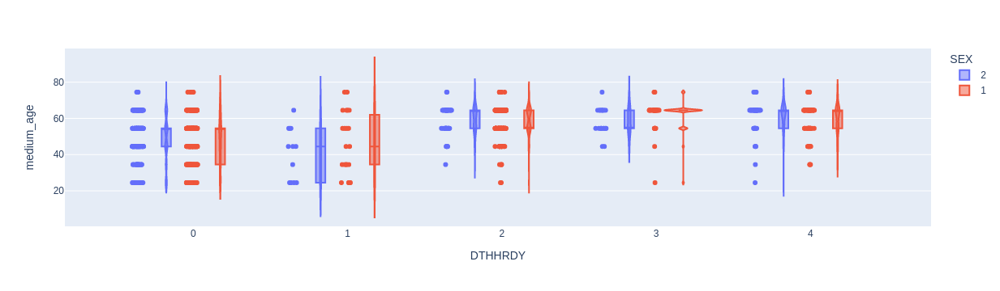

In [12]:
import plotly.express as px
pheno_pandas = phenotypes_extended.to_pandas()
fig_d = px.violin(pheno_pandas, y="medium_age", x="DTHHRDY", color="SEX", box=True, points="all")
fig_d.show()

In [ ]:
## Preparing the table for training

In [14]:
expressions.head(10)

Name,ENSG00000223972.5,ENSG00000227232.5,ENSG00000278267.1,ENSG00000243485.5,ENSG00000237613.2,ENSG00000268020.3,ENSG00000240361.1,ENSG00000186092.4,ENSG00000238009.6,ENSG00000233750.3,ENSG00000268903.1,ENSG00000269981.1,ENSG00000239906.1,ENSG00000241860.6,ENSG00000222623.1,ENSG00000241599.1,ENSG00000279928.2,ENSG00000279457.4,ENSG00000273874.1,ENSG00000228463.9,ENSG00000236679.2,ENSG00000236743.1,ENSG00000236601.2,ENSG00000237094.11,ENSG00000269732.1,ENSG00000278566.1,ENSG00000233653.3,ENSG00000250575.1,ENSG00000278757.1,ENSG00000230021.8,ENSG00000235146.2,ENSG00000225972.1,ENSG00000225630.1,ENSG00000237973.1,ENSG00000229344.1,ENSG00000240409.1,...,ENSG00000210049.1,ENSG00000211459.2,ENSG00000210077.1,ENSG00000210082.2,ENSG00000209082.1,ENSG00000198888.2,ENSG00000210100.1,ENSG00000210107.1,ENSG00000210112.1,ENSG00000198763.3,ENSG00000210117.1,ENSG00000210127.1,ENSG00000210135.1,ENSG00000210140.1,ENSG00000210144.1,ENSG00000198804.2,ENSG00000210151.2,ENSG00000210154.1,ENSG00000198712.1,ENSG00000210156.1,ENSG00000228253.1,ENSG00000198899.2,ENSG00000198938.2,ENSG00000210164.1,ENSG00000198840.2,ENSG00000210174.1,ENSG00000212907.2,ENSG00000198886.2,ENSG00000210176.1,ENSG00000210184.1,ENSG00000210191.1,ENSG00000198786.2,ENSG00000198695.2,ENSG00000210194.1,ENSG00000198727.2,ENSG00000210195.2,ENSG00000210196.2
str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,...,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str
"""Description""","""DDX11L1""","""WASH7P""","""MIR6859-1""","""MIR1302-2HG""","""FAM138A""","""OR4G4P""","""OR4G11P""","""OR4F5""","""RP11-34P13.7""","""CICP27""","""RP11-34P13.15""","""RP11-34P13.16""","""RP11-34P13.14""","""RP11-34P13.13""","""RNU6-1100P""","""RP11-34P13.9""","""ABC7-43046700E...","""RP11-34P13.18""","""MIR6859-2""","""AP006222.2""","""RPL23AP24""","""RP5-857K21.15""","""RP4-669L17.2""","""RP4-669L17.10""","""WBP1LP7""","""OR4F29""","""CICP7""","""RP4-669L17.8""","""U6""","""RP5-857K21.4""","""RP5-857K21.2""","""MTND1P23""","""MTND2P28""","""MTCO1P12""","""MTCO2P12""","""MTATP8P1""",...,"""MT-TF""","""MT-RNR1""","""MT-TV""","""MT-RNR2""","""MT-TL1""","""MT-ND1""","""MT-TI""","""MT-TQ""","""MT-TM""","""MT-ND2""","""MT-TW""","""MT-TA""","""MT-TN""","""MT-TC""","""MT-TY""","""MT-CO1""","""MT-TS1""","""MT-TD""","""MT-CO2""","""MT-TK""","""MT-ATP8""","""MT-ATP6""","""MT-CO3""","""MT-TG""","""MT-ND3""","""MT-TR""","""MT-ND4L""","""MT-ND4""","""MT-TH""","""MT-TS2""","""MT-TL2""","""MT-ND5""","""MT-ND6""","""MT-TE""","""MT-CYB""","""MT-TT""","""MT-TP"""
"""GTEX-1117F-022...","""0""","""8.764""","""0""","""0.07187""","""0""","""0""","""0.06621""","""0""","""0""","""0.03595""","""3.215""","""7.012""","""0""","""0.2311""","""0""","""0.1362""","""0.5459""","""10.91""","""0""","""0.7821""","""0""","""0""","""0""","""0.4106""","""0""","""0""","""0""","""0""","""0""","""0.06633""","""0""","""8.532""","""359""","""27.95""","""11.68""","""22.81""",...,"""1.753""","""2146""","""0.902""","""6310""","""11.62""","""1.587e+04""","""0.943""","""0.902""","""0""","""9515""","""0.9152""","""2.706""","""1.705""","""3.83""","""11.49""","""1.079e+04""","""64.94""","""0""","""1.172e+04""","""0.8891""","""1.073e+04""","""1.388e+04""","""1.989e+04""","""0""","""3453""","""0""","""5179""","""1.24e+04""","""0""","""0""","""0""","""2928""","""3799""","""16.24""","""6938""","""0.943""","""0"""
"""GTEX-1117F-042...","""0""","""3.861""","""0""","""0""","""0""","""0.056""","""0.05004""","""0.1025""","""0.04574""","""0.01359""","""0.2492""","""0.4969""","""0""","""0.03037""","""0""","""0""","""0.165""","""4.579""","""0""","""0.2102""","""0""","""0""","""0""","""0.1441""","""0.5183""","""0.05009""","""0.0192""","""0.03797""","""0""","""0.08774""","""0""","""31.87""","""650.7""","""68.36""","""30.21""","""74.21""",...,"""1.988""","""2653""","""0.6817""",""

In [ ]:
expressions.join()